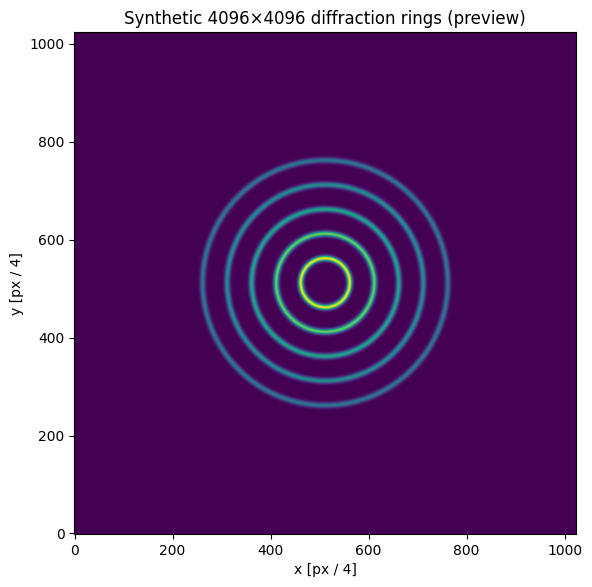

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from math import sqrt

N = 4096
pixel_size_mm = 0.1  # physical pixel size if wanted (just metadata)
ring_radii_px = [200, 400, 600, 800, 1000]  # ring centers in pixels
ring_width_px = 15  # std dev of gaussian ring
ring_intensity = [1.0, 0.8, 0.6, 0.5, 0.4]  # relative intensity per ring
background = 1e-3  # uniform background

y, x = np.indices((N, N))
cx = cy = N // 2
r = np.sqrt((x - cx) ** 2 + (y - cy) ** 2)

image = np.full((N, N), background, dtype=np.float32)

for radius, amp in zip(ring_radii_px, ring_intensity):
    image += amp * np.exp(-0.5 * ((r - radius) / ring_width_px) ** 2)

# Apply Poisson noise scaled to some maximum counts
scale_counts = 1e4  # scaling factor to convert to counts
noisy_counts = np.random.poisson(image * scale_counts).astype(np.float32)

# convert back to arbitrary units by dividing scale
noisy = noisy_counts / scale_counts

# plot a downsampled view for rendering speed
fig, ax = plt.subplots(figsize=(6,6))
ax.imshow(noisy[::4, ::4], origin='lower')  # show every 4th pixel
ax.set_title("Synthetic 4096×4096 diffraction rings (preview)")
ax.set_xlabel("x [px / 4]")
ax.set_ylabel("y [px / 4]")
plt.tight_layout()



In [2]:
import numpy as np
from scipy.ndimage import gaussian_filter
from numpy.random import default_rng

# ----------------------------- parameters -----------------------------
N          = 4096                   # full side length
Q          = N // 2                 # quadrant side length
rng        = default_rng(1234)

# ring physics ---------------------------------------------------------
ring_r_px      = [250, 500, 800, 1000]     # ring radii in px
ring_sigma_px  = 10                        # width of each ring
ring_intensity = [1.0, 0.7, 0.5, 0.3]      # relative heights

# detector/optics ------------------------------------------------------
psf_sigma_px   = 4.0                       # isotropic blur
gain_mean      = 1.0; gain_sigma = 0.05    # flat-field standard dev.
dead_frac      = 2e-4                      # 0.02 % pixels fully dead
exposure_scale = 2e4                       # counts per unit intensity

# --------------------------- 1. ideal quadrant ------------------------
y, x = np.indices((Q, Q))
r = np.hypot(x, y)                         # centre of beam at (0,0) in quadrant
I = np.zeros((Q, Q), dtype=np.float32)
for R, amp in zip(ring_r_px, ring_intensity):
    I += amp * np.exp(-0.5 * ((r - R) / ring_sigma_px) ** 2)

# --------------------------- 2. PSF blur ------------------------------
I_blurred = gaussian_filter(I, psf_sigma_px, mode='reflect')

# --------------------------- 3. flat-field ----------------------------
gain_map = rng.normal(gain_mean, gain_sigma, size=(Q, Q))
I_gain   = I_blurred * gain_map

# randomly kill a small fraction of pixels
mask_dead = rng.random((Q, Q)) < dead_frac
I_gain[mask_dead] = 0.0

# --------------------------- 4. Poisson noise -------------------------
counts_quadrant = rng.poisson(I_gain * exposure_scale).astype(np.uint32)

# --------------------------- 5. assemble full frame -------------------
# helper to mirror without duplicating the central row/col
def mirror(mat):
    return np.concatenate((mat, mat[::-1, :]), axis=0)

top_half  = np.concatenate((counts_quadrant, counts_quadrant[:, ::-1]), axis=1)
full_raw  = np.concatenate((top_half[::-1, :], top_half), axis=0)

# optional: insert 5-pixel vertical & horizontal module gaps
gap = 5
full = full_raw.copy()
full[Q-gap:Q+gap, :] = 0          # horizontal gap
full[:, Q-gap:Q+gap] = 0          # vertical gap

# --------------------------- save & quick-look ------------------------
np.save("synthetic_diffraction.npy", full)      # 16 MB compressed
print("Saved 4 096×4 096 frame  →  synthetic_diffraction.npy")


Saved 4 096×4 096 frame  →  synthetic_diffraction.npy


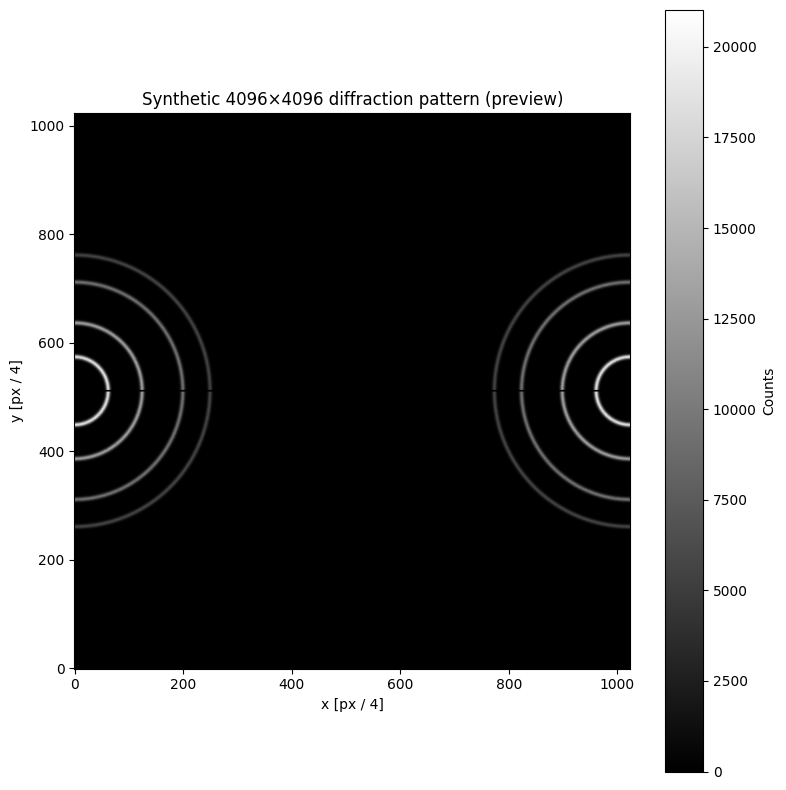

In [4]:
# display the full frame
plt.figure(figsize=(8, 8))
plt.imshow(full[::4, ::4], origin='lower', cmap='gray')  # downsampled for speed
plt.title("Synthetic 4096×4096 diffraction pattern (preview)")
plt.xlabel("x [px / 4]")
plt.ylabel("y [px / 4]")
plt.colorbar(label='Counts')
plt.tight_layout()
plt.show()

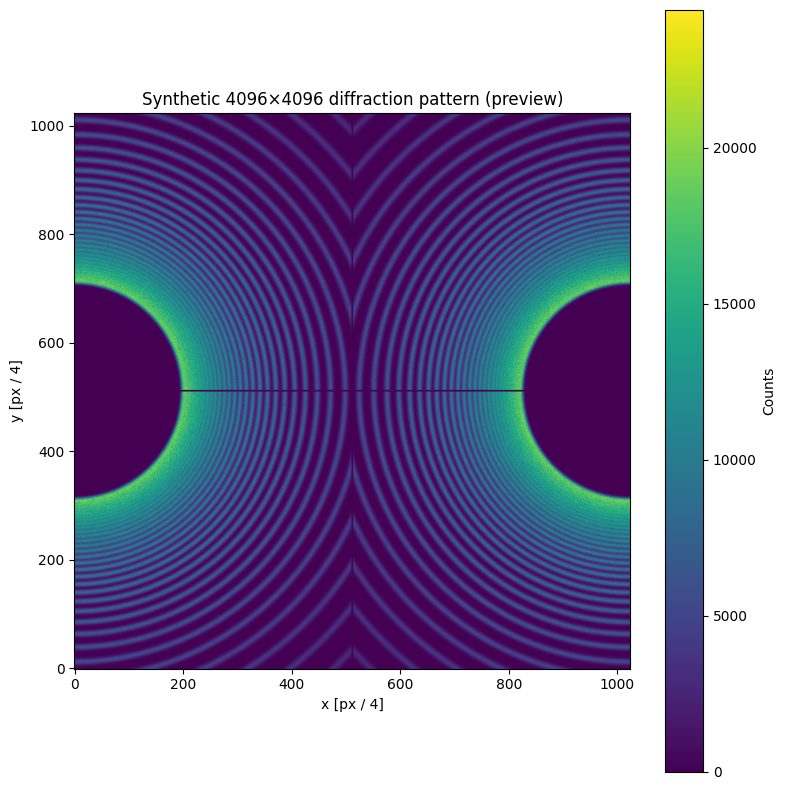

In [ ]:
import numpy as np
from scipy.ndimage import gaussian_filter
from numpy.random   import default_rng

# ---------------- 1. PARAMETERS you’ll tweak ---------------------------
N              = 4096
Q              = N // 2                 # quadrant side
rng            = default_rng(2025)

# --- physics -----------------------------------------------------------
lambda_A       = 1.8                    # wavelength [Å]  (sets max Q)
d_list         = np.linspace(2.3, 0.5, 35)   # Å, fake d‐spacing list
ring_r_px      = (lambda_A / (2*d_list) * Q).astype(float)   # pixel radii
sigma0         = 6.0                    # base ring σ  [px]
sigma_slope    = 0.004                  # σ increases with radius
fade_len       = 1200.0                 # exponential intensity decay scale [px]
intensity0     = 1.0                    # centre ring height

# --- detector ----------------------------------------------------------
psf_sigma_px   = 5.0                    # scintillator/optics blur
gain_sigma     = 0.08                   # flat-field std-dev (slow drift)
dead_frac      = 5e-4                   # fraction of dead pixels
texture_amp    = 0.30                   # azimuthal speckle strength
texture_q      = 16                     # “graininess” (higher → finer speckle)
exposure_scale = 3e4                    # counts per unit inten.
gap            = 6                      # pixel gap between modules

# ---------------- 2. IDEAL INTENSITY, ONE QUADRANT ---------------------
y, x = np.indices((Q, Q))
r    = np.hypot(x, y)                   # radial coord
phi  = np.arctan2(y, x)                 # azimuth 0..π/2

I = np.zeros_like(r, dtype=float)
for R in ring_r_px:
    sigma = sigma0 + sigma_slope * R
    peak  = intensity0 * np.exp(-R/fade_len)
    profile = peak * np.exp(-0.5*((r-R)/sigma)**2)

    # add azimuthal speckle texture
    speckle = 1 + texture_amp * rng.normal(size=r.shape)
    speckle = gaussian_filter(speckle, texture_q, mode='wrap')
    profile *= speckle

    I += profile

# ---------------- 3. DETECTOR EFFECTS ----------------------------------
# 3a. optical blur
I_blur = gaussian_filter(I, psf_sigma_px, mode='reflect')

# 3b. flat-field + dead pixels
gain = rng.normal(1.0, gain_sigma, size=I.shape)
I_ff = I_blur * gain
mask_dead = rng.random(I.shape) < dead_frac
I_ff[mask_dead] = 0.0

# 3c. Poisson counting statistics
counts_q = rng.poisson(I_ff * exposure_scale).astype(np.uint32)

# ---------------- 4. STITCH FOUR QUADRANTS + GAPS ----------------------
top_half = np.concatenate((counts_q, counts_q[:, ::-1]), axis=1)
full_raw = np.concatenate((top_half[::-1, :], top_half), axis=0)

full = full_raw.copy()
# vertical & horizontal gaps
full[Q-gap:Q+gap, :] = 0
full[:, Q-gap:Q+gap] = 0

# display the full frame
plt.figure(figsize=(8, 8))
plt.imshow(full, origin='lower', cmap='viridis')  # downsampled for speed
plt.title("Synthetic 4096×4096 diffraction pattern (preview)")
plt.xlabel("x [px / 4]")
plt.ylabel("y [px / 4]")
plt.colorbar(label='Counts')
plt.tight_layout()
plt.show()


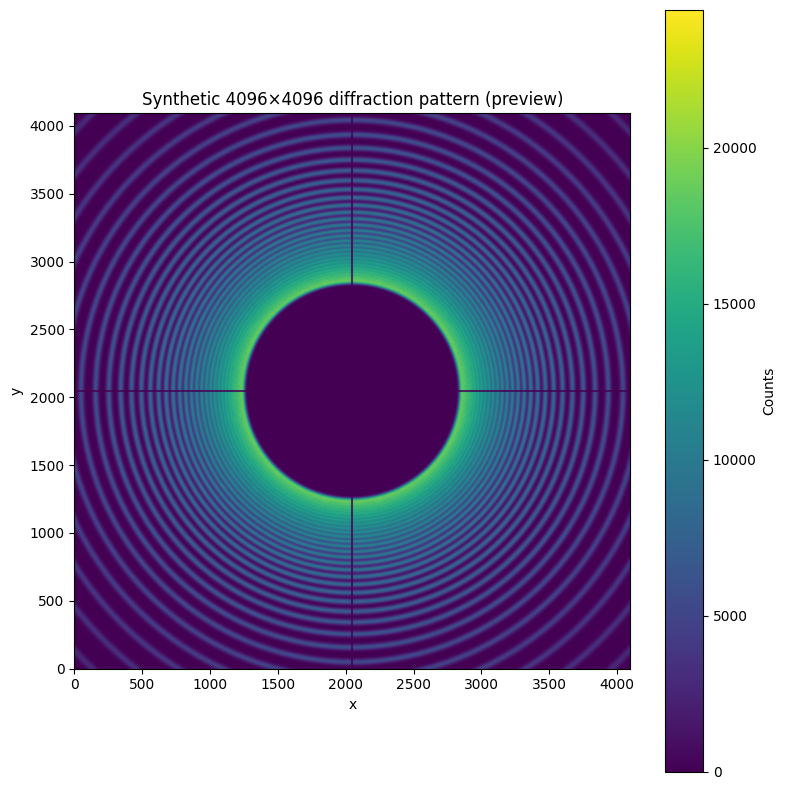

In [7]:
# ---------- build ideal intensity on ONE quadrant ----------
y, x  = np.indices((Q, Q))
cx = cy = Q - 0.5                      # centre of the full detector
r  = np.hypot(x - cx, y - cy)          # correct radial distance
phi = np.arctan2(y - cy, x - cx)       # if you still need azimuth

# ... [generate I exactly as before, using this r instead] ...

# ---------- Poisson noise etc. identical to previous script ----------

# ---------- assemble 4 quadrants ----------
# mirror without seams (no duplicate centre row/col)
top_half  = np.concatenate((counts_q[:, ::-1], counts_q), axis=1)
full_raw  = np.concatenate((top_half[::-1, :], top_half), axis=0)

# module gaps
full = full_raw.copy()
full[Q-gap:Q+gap, :] = 0
full[:, Q-gap:Q+gap] = 0

# ---------- save & show full frame ----------

plt.figure(figsize=(8, 8))
plt.imshow(full, origin='lower', cmap='viridis')
plt.title("Synthetic 4096×4096 diffraction pattern (preview)")
plt.xlabel("x"); plt.ylabel("y")
plt.colorbar(label='Counts')
plt.tight_layout()
plt.show()


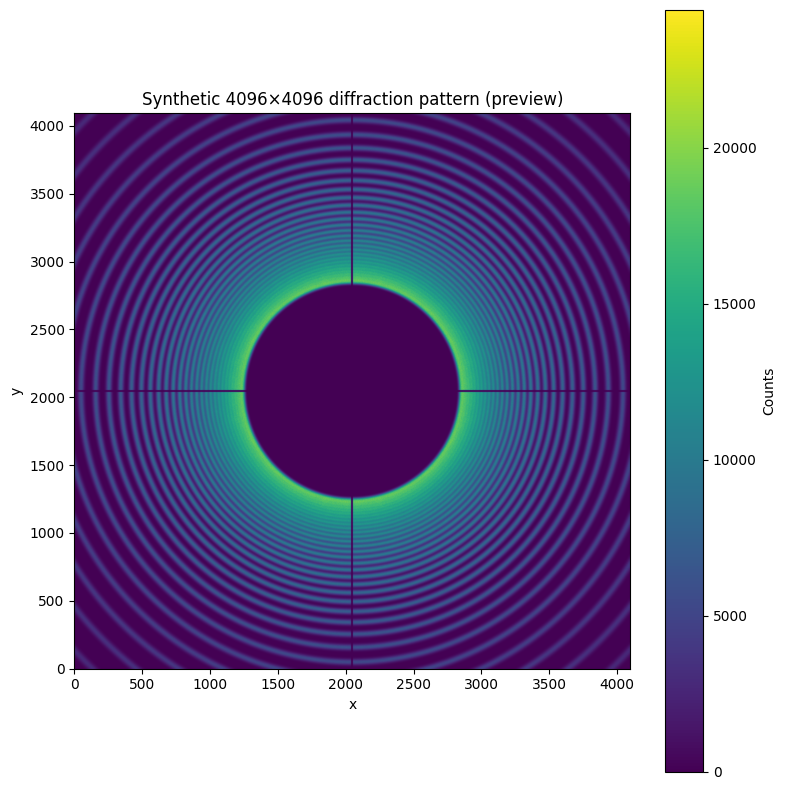

In [10]:
# … keep the existing import + parameter blocks …

# === 0. extra knobs =====================================================
tilt_deg      = 4.0       # obvious ellipticity
wiggle_amp_px = 40        # deep ripple
wiggle_harm   = 6
hotspot_frac  = 2e-3      # plenty of bright dots
hotspot_gain  = 12
edge_streak   = 0.75      # dark module seams

# === 1. coordinates (with detector tilt) ================================
y, x = np.indices((Q, Q)).astype(float)
if tilt_deg:
    theta = np.deg2rad(tilt_deg)
    x, y = (np.cos(theta)*x + np.sin(theta)*y,
            -np.sin(theta)*x + np.cos(theta)*y)

cx = cy = Q - 0.5
r  = np.hypot(x - cx, y - cy)
phi = np.arctan2(y - cy, x - cx)

# === 2. ideal intensity with wiggle =====================================
I = np.zeros_like(r)
for R in ring_r_px:
    # wiggle the nominal radius
    Rwig = R + wiggle_amp_px * np.sin(wiggle_harm * phi)
    sigma = sigma0 + sigma_slope * R
    peak  = intensity0 * np.exp(-R/fade_len)

    profile = peak * np.exp(-0.5 * ((r - Rwig)/sigma)**2)
    speckle = 1 + texture_amp * rng.normal(size=r.shape)
    speckle = gaussian_filter(speckle, texture_q, mode='wrap')
    I += profile * speckle

# … keep PSF blur, flat-field, dead pixels, Poisson noise …

# === 3. sprinkle hot-spot grains ========================================
mask_ring = I_ff > I_ff.mean()          # pixels that belong to rings
idx       = np.where(mask_ring)
pick      = rng.choice(len(idx[0]), int(hotspot_frac * len(idx[0])), replace=False)
counts_q[idx[0][pick], idx[1][pick]] *= hotspot_gain

# === 4. stitch quadrants (unchanged) ====================================

# === 5. darken module seams (streaks) ===================================
full[:, Q-gap-3:Q+gap+3]   = (full[:, Q-gap-3:Q+gap+3]   * edge_streak).astype(full.dtype)
full[Q-gap-3:Q+gap+3, :]   = (full[Q-gap-3:Q+gap+3, :]   * edge_streak).astype(full.dtype)

# === 6. display full frame (same as your snippet) =======================
plt.figure(figsize=(8, 8))
plt.imshow(full, origin='lower', cmap='viridis')
plt.title("Synthetic 4096×4096 diffraction pattern (preview)")
plt.xlabel("x"); plt.ylabel("y")
plt.colorbar(label='Counts')
plt.tight_layout(); plt.show()


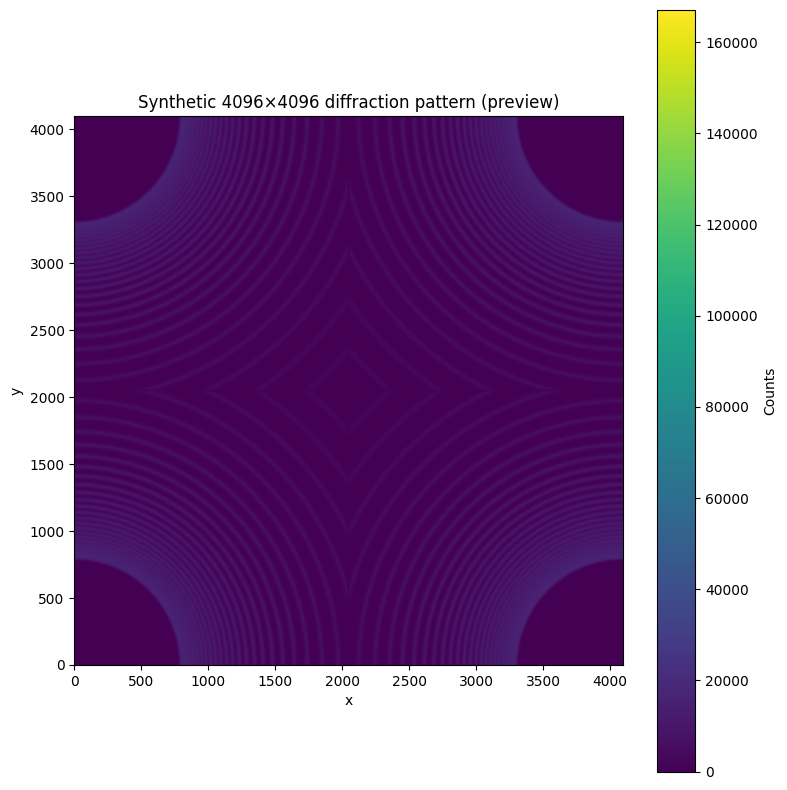

In [17]:
import numpy as np
from   scipy.ndimage import gaussian_filter
from   numpy.random   import default_rng
import matplotlib.pyplot as plt

# ────────────── USER-TUNABLE PARAMETERS ────────────────────────────────
N              = 4096              # full detector side
λ_A            = 1.8               # wavelength [Å]
d_spacings     = np.linspace(2.3, 0.5, 30)     # fake d list
sigma0, slope  = 6.0, 0.004        # ring width model
fade_len       = 1200.0
psf_sigma      = 5.0
gain_sigma     = 0.05
dead_frac      = 2e-4
counts_scale   = 3e4
gap_px         = 6

# hotspot parameters
hot_frac       = 4e-4              # fraction of ring pixels brightened
hot_gain       = 10

rng = default_rng(2025)
# ───────────────── COORDINATES (single quadrant) ───────────────────────
Q = N // 2
yy, xx = np.indices((Q, Q))
cx = cy = Q - 0.5                  # real beam centre relative to quadrant
r  = np.hypot(xx - cx, yy - cy)    # correct curvature

# ───────────────── IDEAL INTENSITY (quadrant) ──────────────────────────
ring_r = λ_A / (2*d_spacings) * Q
I = np.zeros_like(r, dtype=float)

for R in ring_r:
    σ  = sigma0 + slope*R
    pk = np.exp(-R/fade_len)
    I += pk * np.exp(-0.5*((r - R)/σ)**2)

# ───────────────── DETECTOR RESPONSE ───────────────────────────────────
I = gaussian_filter(I, psf_sigma, mode='reflect')
I *= rng.normal(1.0, gain_sigma, I.shape)
I[rng.random(I.shape) < dead_frac] = 0.0

counts_q = rng.poisson(I * counts_scale).astype(np.uint32)

# ───────────────── ADD HOT-GRAIN SPOTS ─────────────────────────────────
mask_ring = I > I.mean()
idx       = np.column_stack(np.where(mask_ring))
sel       = rng.choice(len(idx), int(hot_frac*len(idx)), replace=False)
counts_q[idx[sel,0], idx[sel,1]] *= hot_gain

# ───────────────── STITCH FOUR QUADRANTS CORRECTLY ─────────────────────
TL = counts_q[::-1, ::-1]   # top-left
TR = counts_q[::-1, :]      # top-right
BL = counts_q[:, ::-1]      # bottom-left
BR = counts_q               # bottom-right

top    = np.concatenate((TL, TR), axis=1)
bottom = np.concatenate((BL, BR), axis=1)
full   = np.concatenate((top, bottom), axis=0)

# module gap cross
full[Q-gap_px:Q+gap_px, :] = 0
full[:, Q-gap_px:Q+gap_px] = 0

# ───────────────── SAVE + PREVIEW ──────────────────────────────────────
plt.figure(figsize=(8,8))
plt.imshow(full, origin='lower', cmap='viridis')
plt.title("Synthetic 4096×4096 diffraction pattern (preview)")
plt.xlabel("x"); plt.ylabel("y")
plt.colorbar(label="Counts")
plt.tight_layout(); plt.show()


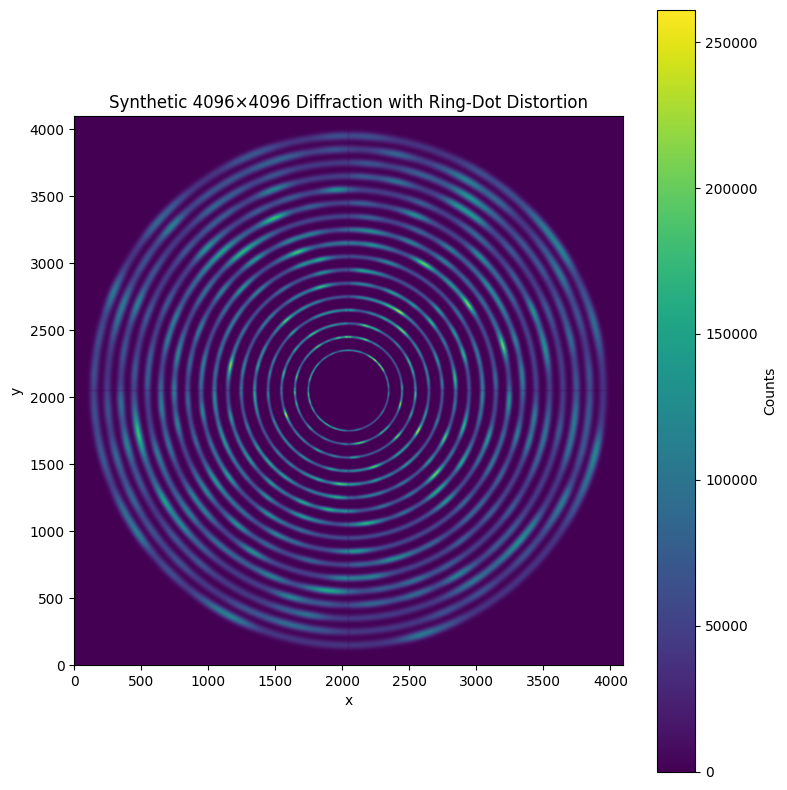

In [22]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# ─── User knobs ─────────────────────────────────────────────────────────
Q             = 4096            # detector size in pixels
ring_r_px     = np.arange(300, Q//2 - 100, 100)
sigma0        = 1.0
sigma_slope   = 0.01
intensity0    = 1e5
fade_len      = Q//2
texture_amp   = 0.1
texture_q     = 3.0

mod_amp       = 0.6
num_dots      = 50
dot_width     = 0.05

psf_blurσ     = 1.5
ff_amp        = 0.05
dead_frac     = 1e-4
edge_streak   = 0.75
gap           = 4

rng = np.random.default_rng(0)

# ─── 1) coords & center ────────────────────────────────────────────────
y, x = np.indices((Q, Q), float)
cx = cy = (Q - 1) / 2.0
r  = np.hypot(x - cx, y - cy)
phi = np.arctan2(y - cy, x - cx)

# ─── 2) rings + dots/arcs ──────────────────────────────────────────────
I = np.zeros_like(r)
for R in ring_r_px:
    σ    = sigma0 + sigma_slope * R
    peak = intensity0 * np.exp(-R / fade_len)
    profile = peak * np.exp(-0.5 * ((r - R)/σ)**2)

    speckle = 1 + texture_amp * rng.normal(size=r.shape)
    speckle = gaussian_filter(speckle, texture_q, mode='wrap')

    ang_mod = np.ones_like(phi)
    phis0 = rng.uniform(-np.pi, np.pi, size=num_dots)
    for φ0 in phis0:
        dφ = (phi - φ0 + np.pi) % (2*np.pi) - np.pi
        ang_mod += mod_amp * np.exp(-0.5 * (dφ/dot_width)**2)

    I += profile * speckle * ang_mod

# ─── 3) blur, flat-field, dead, Poisson ────────────────────────────────
I = gaussian_filter(I, psf_blurσ)

ff = 1 + ff_amp * rng.normal(size=I.shape)
ff = gaussian_filter(ff, 50, mode='reflect')
I *= ff

I[rng.random(size=I.shape) < dead_frac] = 0
counts = rng.poisson(np.clip(I, 0, None))

# ─── 4) darken module seams safely ─────────────────────────────────────
full = counts.copy()
half = Q // 2

# vertical seam
x1, x2 = half - gap - 3, half + gap + 3
region = full[:, x1:x2] * edge_streak
full[:, x1:x2] = region.astype(full.dtype)

# horizontal seam
y1, y2 = half - gap - 3, half + gap + 3
region = full[y1:y2, :] * edge_streak
full[y1:y2, :] = region.astype(full.dtype)

# ─── 5) display ───────────────────────────────────────────────────────
plt.figure(figsize=(8,8))
plt.imshow(full, origin='lower', cmap='viridis')
plt.title("Synthetic 4096×4096 Diffraction with Ring-Dot Distortion")
plt.xlabel("x"); plt.ylabel("y")
plt.colorbar(label="Counts")
plt.tight_layout()
plt.show()


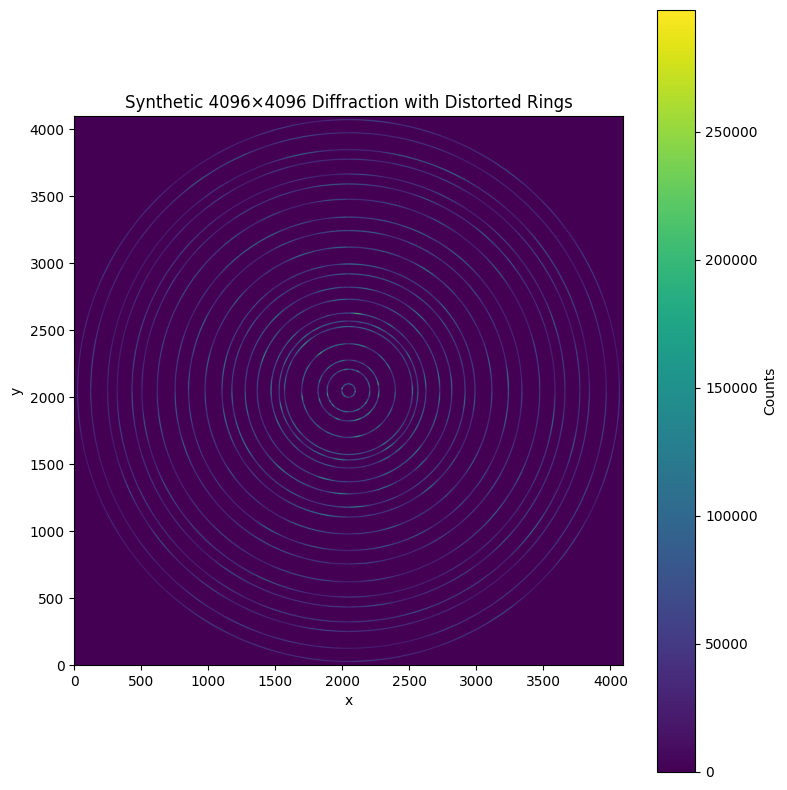

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# ─── User knobs ─────────────────────────────────────────────────────────
Q             = 4096            # detector size in pixels
min_R         = 50              # start radius
max_R         = Q//2 - 20       # maximum radius
mean_spacing  = 100             # average gap between rings
std_spacing   = 30              # jitter in that gap

sigma0        = 2.0             # fixed ring width (all rings same)
intensity0    = 1e5             # central intensity scale
fade_len      = Q//2            # 1/e falloff length
texture_amp   = 0.1             # speckle amplitude
texture_q     = 3.0             # speckle blur radius

# dot/arc modulation
mod_amp       = 0.6             # how bright the dots/arcs are
num_dots      = 60              # spots per ring
dot_width     = 0.05            # angular width of each spot (radians)

# downstream effects
psf_blurσ     = 1.2             # final PSF blur
ff_amp        = 0.05            # flat-field RMS
dead_frac     = 1e-4            # fraction of dead pixels
edge_streak   = 0.75            # strength of module seam darkening
gap           = 4               # seam half-width

rng = np.random.default_rng(42)

# ─── 1) generate randomized ring radii ─────────────────────────────────
ring_r_px = []
R = min_R
while R < max_R:
    ring_r_px.append(R)
    # draw next spacing, but enforce ≥10px
    ds = int(rng.normal(mean_spacing, std_spacing))
    ds = max(ds, 10)
    R += ds

# ─── 2) coordinates & center ────────────────────────────────────────────
y, x = np.indices((Q, Q), float)
cx = cy = (Q - 1) / 2.0
r  = np.hypot(x - cx, y - cy)
phi = np.arctan2(y - cy, x - cx)

# ─── 3) build up I with fixed‐width rings + dots/arcs ─────────────────
I = np.zeros_like(r)
for R in ring_r_px:
    # fixed‐width Gaussian ring
    σ    = sigma0
    peak = intensity0 * np.exp(-R / fade_len)
    profile = peak * np.exp(-0.5 * ((r - R)/σ)**2)

    # speckle texture
    speckle = 1 + texture_amp * rng.normal(size=r.shape)
    speckle = gaussian_filter(speckle, texture_q, mode='wrap')

    # azimuthal dot modulation
    ang_mod = np.ones_like(phi)
    phis0 = rng.uniform(-np.pi, np.pi, size=num_dots)
    for φ0 in phis0:
        dφ = (phi - φ0 + np.pi) % (2*np.pi) - np.pi
        ang_mod += mod_amp * np.exp(-0.5 * (dφ/dot_width)**2)

    I += profile * speckle * ang_mod

# ─── 4) PSF blur, flat‐field, dead pixels, Poisson ─────────────────────
I = gaussian_filter(I, psf_blurσ)

ff = 1 + ff_amp * rng.normal(size=I.shape)
ff = gaussian_filter(ff, 50, mode='reflect')
I *= ff

I[rng.random(size=I.shape) < dead_frac] = 0
counts = rng.poisson(np.clip(I, 0, None))

# ─── 5) darken module seams safely ─────────────────────────────────────
full = counts.copy()
half = Q // 2

# vertical seam
x1, x2 = half-gap-3, half+gap+3
region = full[:, x1:x2] * edge_streak
full[:, x1:x2] = region.astype(full.dtype)

# horizontal seam
y1, y2 = half-gap-3, half+gap+3
region = full[y1:y2, :] * edge_streak
full[y1:y2, :] = region.astype(full.dtype)

# ─── 6) display ───────────────────────────────────────────────────────
plt.figure(figsize=(8,8))
plt.imshow(full, origin='lower', cmap='viridis')
plt.title("Synthetic 4096×4096 Diffraction with Distorted Rings")
plt.xlabel("x"); plt.ylabel("y")
plt.colorbar(label="Counts")
plt.tight_layout()
plt.show()


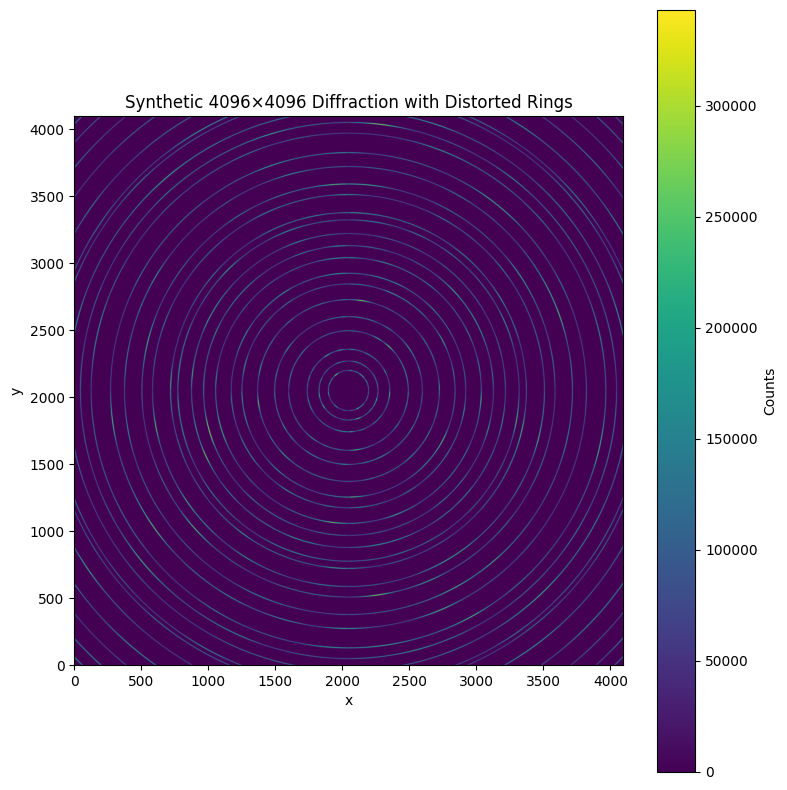

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# ─── User knobs ─────────────────────────────────────────────────────────
Q             = 4096            # frame size
min_R         = 150             # bigger inner blank
margin        = 20              # keep rings inside corners
mean_spacing  = 100             # avg ring‐to‐ring gap
std_spacing   = 30              # jitter on that gap

sigma0        = 2.0             # fixed ring width
intensity0    = 1e5             # base peak counts
fade_len      = 10 * Q          # very long fall‐off so outer ≈ inner

texture_amp   = 0.1             
texture_q     = 3.0             

mod_amp       = 0.6            
num_dots      = 60             
dot_width     = 0.05           

psf_blurσ     = 1.2             
ff_amp        = 0.05            
dead_frac     = 1e-4            
edge_streak   = 0.75            
gap           = 4              

rng = np.random.default_rng(123)

# ─── 1) center + max radius ─────────────────────────────────────────────
cx = cy = (Q - 1) / 2.0
diag_max = np.hypot(cx, cy)
max_R = diag_max - margin      # reaches into the corners

# ─── 2) randomized ring radii ──────────────────────────────────────────
ring_r_px = []
R = min_R
while R < max_R:
    ring_r_px.append(R)
    ds = int(rng.normal(mean_spacing, std_spacing))
    R += max(ds, 10)

# ─── 3) coords & angles ─────────────────────────────────────────────────
y, x = np.indices((Q, Q), float)
r   = np.hypot(x - cx, y - cy)
phi = np.arctan2(y - cy, x - cx)

# ─── 4) build rings + dots/arcs ────────────────────────────────────────
I = np.zeros_like(r)
for R in ring_r_px:
    σ    = sigma0
    peak = intensity0 * np.exp(-R/fade_len)
    profile = peak * np.exp(-0.5*((r-R)/σ)**2)

    speckle = 1 + texture_amp * rng.normal(size=r.shape)
    speckle = gaussian_filter(speckle, texture_q, mode='wrap')

    ang_mod = np.ones_like(phi)
    phis0 = rng.uniform(-np.pi, np.pi, size=num_dots)
    for φ0 in phis0:
        dφ = (phi - φ0 + np.pi) % (2*np.pi) - np.pi
        ang_mod += mod_amp * np.exp(-0.5*(dφ/dot_width)**2)

    I += profile * speckle * ang_mod

# ─── 5) PSF, flat-field, dead, Poisson ──────────────────────────────────
I = gaussian_filter(I, psf_blurσ)
ff = 1 + ff_amp * rng.normal(size=I.shape)
ff = gaussian_filter(ff, 50, mode='reflect')
I *= ff
I[rng.random(size=I.shape) < dead_frac] = 0
counts = rng.poisson(np.clip(I, 0, None))

# ─── 6) darken seams ────────────────────────────────────────────────────
full = counts.copy()
half = Q // 2

# vertical
x1, x2 = half-gap-3, half+gap+3
tmp = full[:, x1:x2] * edge_streak
full[:, x1:x2] = tmp.astype(full.dtype)

# horizontal
y1, y2 = half-gap-3, half+gap+3
tmp = full[y1:y2, :] * edge_streak
full[y1:y2, :] = tmp.astype(full.dtype)

# ─── 7) display ───────────────────────────────────────────────────────
plt.figure(figsize=(8,8))
plt.imshow(full, origin='lower', cmap='viridis')
plt.title("Synthetic 4096×4096 Diffraction with Distorted Rings")
plt.xlabel("x"); plt.ylabel("y")
plt.colorbar(label="Counts")
plt.tight_layout()
plt.show()


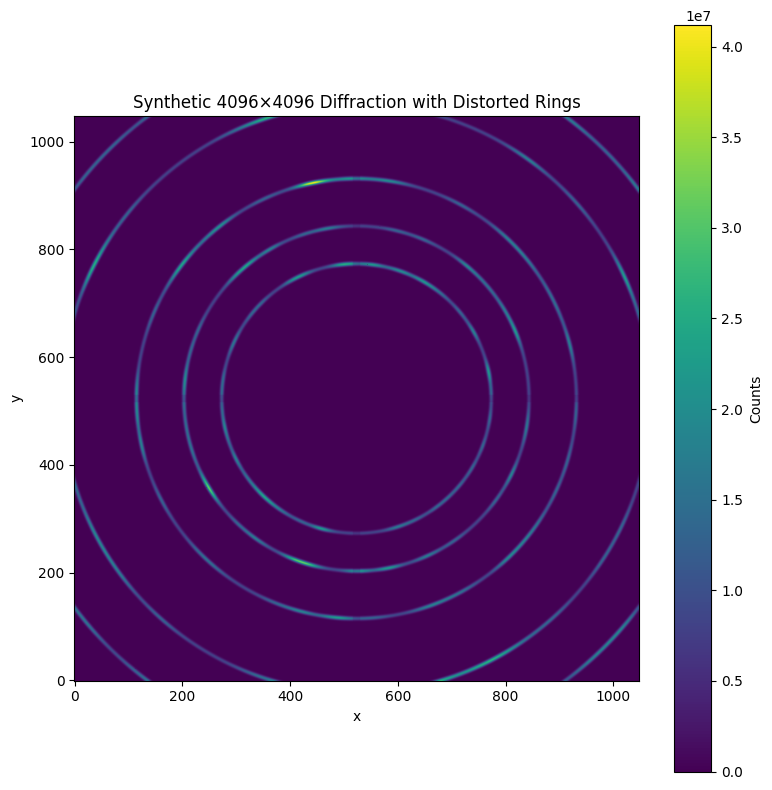

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

# ─── User knobs ─────────────────────────────────────────────────────────
Q             = 1048            # frame size
min_R         = 250             # bigger inner blank
margin        = 20              # keep rings inside corners
mean_spacing  = 100             # avg ring‐to‐ring gap
std_spacing   = 30              # jitter on that gap

sigma0        = 2.0             # fixed ring width
intensity0    = 1e7             # base peak counts
fade_len      = 10 * Q          # very long fall‐off so outer ≈ inner

texture_amp   = 0.1             
texture_q     = 3.0             

mod_amp       = 0.6            
num_dots      = 60             
dot_width     = 0.05           

psf_blurσ     = 1.2             
ff_amp        = 0.05            
dead_frac     = 1e-4            
edge_streak   = 0.75            
gap           = 4              

rng = np.random.default_rng(123)

# ─── 1) center + max radius ─────────────────────────────────────────────
cx = cy = (Q - 1) / 2.0
diag_max = np.hypot(cx, cy)
max_R = diag_max - margin      # reaches into the corners

# ─── 2) randomized ring radii ──────────────────────────────────────────
ring_r_px = []
R = min_R
while R < max_R:
    ring_r_px.append(R)
    ds = int(rng.normal(mean_spacing, std_spacing))
    R += max(ds, 10)

# ─── 3) coords & angles ─────────────────────────────────────────────────
y, x = np.indices((Q, Q), float)
r   = np.hypot(x - cx, y - cy)
phi = np.arctan2(y - cy, x - cx)

# ─── 4) build rings + dots/arcs ────────────────────────────────────────
I = np.zeros_like(r)
for R in ring_r_px:
    σ    = sigma0
    peak = intensity0 * np.exp(-R/fade_len)
    profile = peak * np.exp(-0.5*((r-R)/σ)**2)

    speckle = 1 + texture_amp * rng.normal(size=r.shape)
    speckle = gaussian_filter(speckle, texture_q, mode='wrap')

    ang_mod = np.ones_like(phi)
    phis0 = rng.uniform(-np.pi, np.pi, size=num_dots)
    for φ0 in phis0:
        dφ = (phi - φ0 + np.pi) % (2*np.pi) - np.pi
        ang_mod += mod_amp * np.exp(-0.5*(dφ/dot_width)**2)

    I += profile * speckle * ang_mod

# ─── 5) PSF, flat-field, dead, Poisson ──────────────────────────────────
I = gaussian_filter(I, psf_blurσ)
ff = 1 + ff_amp * rng.normal(size=I.shape)
ff = gaussian_filter(ff, 50, mode='reflect')
I *= ff
I[rng.random(size=I.shape) < dead_frac] = 0
counts = rng.poisson(np.clip(I, 0, None))

# ─── 6) darken seams ────────────────────────────────────────────────────
full = counts.copy()
half = Q // 2

# vertical
x1, x2 = half-gap-3, half+gap+3
tmp = full[:, x1:x2] * edge_streak
full[:, x1:x2] = tmp.astype(full.dtype)

# horizontal
y1, y2 = half-gap-3, half+gap+3
tmp = full[y1:y2, :] * edge_streak
full[y1:y2, :] = tmp.astype(full.dtype)

# ─── 7) display ───────────────────────────────────────────────────────
plt.figure(figsize=(8,8))
plt.imshow(full, origin='lower', cmap='viridis')
plt.title("Synthetic 4096×4096 Diffraction with Distorted Rings")
plt.xlabel("x"); plt.ylabel("y")
plt.colorbar(label="Counts")
plt.tight_layout()
plt.show()


In [44]:
data = r"imaging_small.h5"
import h5py
with h5py.File(data, 'r') as f:
    keys = list(f.keys())
    print("Available datasets:", keys)
    
    print(f["x"]) 
    

Available datasets: ['TOT', 'time', 'x', 'y']
<HDF5 dataset "x": shape (15646982,), type "<i2">


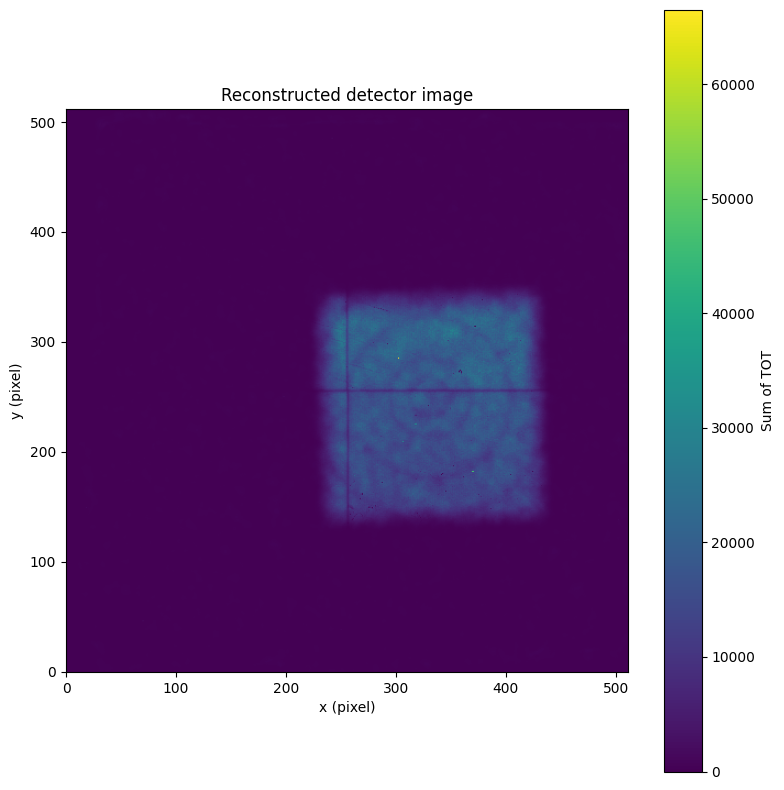

In [45]:
import h5py
import numpy as np
import matplotlib.pyplot as plt

# --- Load the HDF5 file ----
filename = "imaging_small.h5"   # assumes the file is in the working directory
try:
    with h5py.File(filename, 'r') as f:
        x   = f['x'][:]         # event‑wise x pixel indices
        y   = f['y'][:]         # event‑wise y pixel indices
        if 'TOT' in f:
            weights = f['TOT'][:]   # time‑over‑threshold (or counts) per event
        else:
            weights = None
except FileNotFoundError as e:
    raise RuntimeError(f"Could not find {filename}. Please upload or provide a correct path.") from e

# --- Normalise coordinates so the smallest index is 0 (in case they start at 1) ---
x = x - x.min()
y = y - y.min()

nx = int(x.max()) + 1
ny = int(y.max()) + 1

# --- Accumulate events into a 2‑D image ---
img = np.zeros((ny, nx), dtype=np.float32)

if weights is None:
    # simple hit count
    np.add.at(img, (y, x), 1)
    cbar_label = "Event counts"
else:
    # sum of TOT (or whatever weight is supplied)
    np.add.at(img, (y, x), weights)
    cbar_label = "Sum of TOT"

# --- Plot with viridis colormap ---
plt.figure(figsize=(8, 8))
plt.imshow(img, origin='lower', cmap='viridis', aspect='equal')
plt.colorbar(label=cbar_label)
plt.xlabel("x (pixel)")
plt.ylabel("y (pixel)")
plt.title("Reconstructed detector image")
plt.tight_layout()
plt.show()


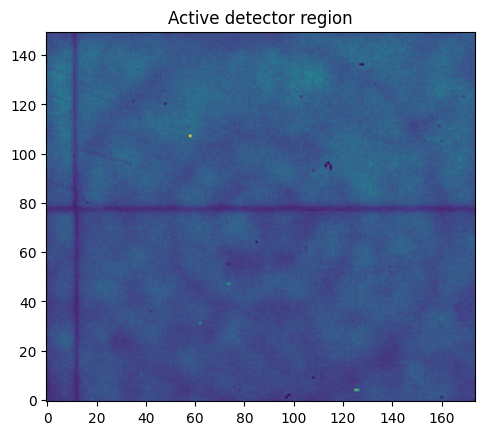

In [46]:
mask   = img > np.percentile(img, 99)   # bright pixels
ys, xs = np.where(mask)
crop   = img[ys.min():ys.max()+1, xs.min():xs.max()+1]

plt.imshow(crop, origin="lower", cmap="viridis")
plt.title("Active detector region")
plt.show()


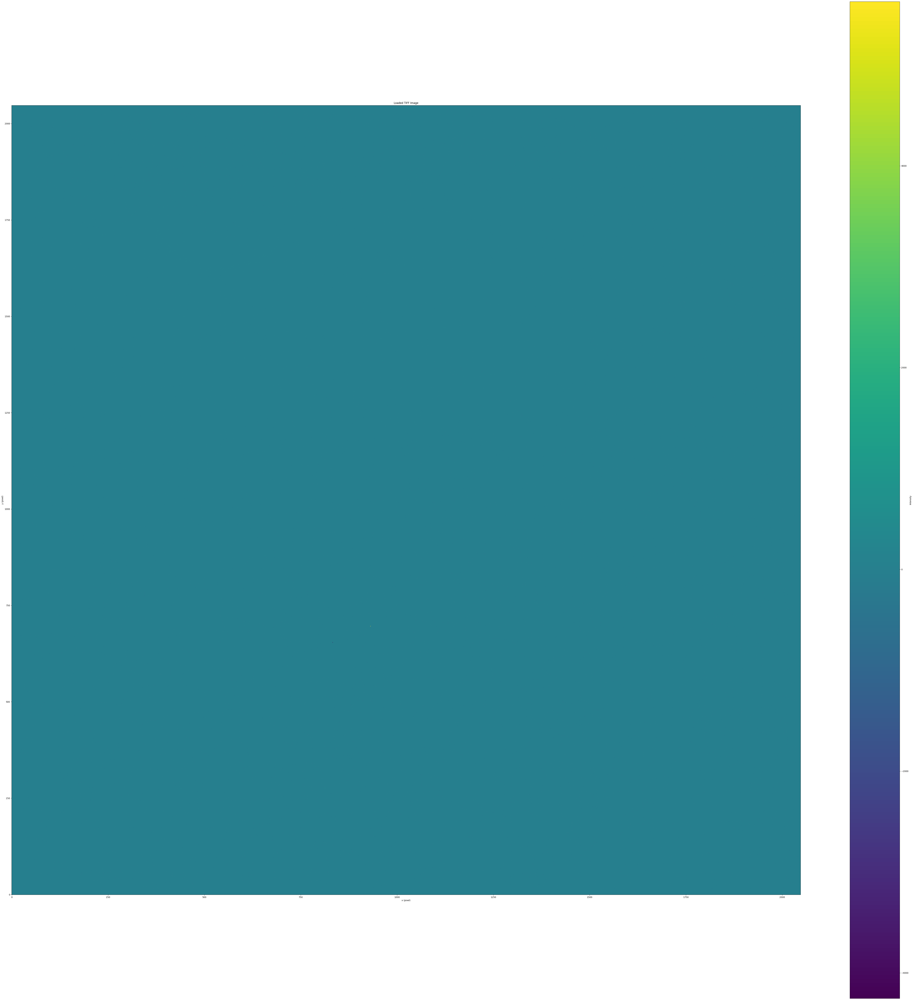

In [ ]:
path = "raw_img_00000.tif"
import tifffile as tiff
# Load the TIFF image
img = tiff.imread(path)
# Display the image
plt.figure(figsize=(8, 8))
plt.imshow(img, cmap='viridis', origin='lower')
plt.title("Loaded TIFF Image")
plt.xlabel("x (pixel)")
plt.ylabel("y (pixel)")
plt.colorbar(label="Intensity")
plt.tight_layout()
plt.show()

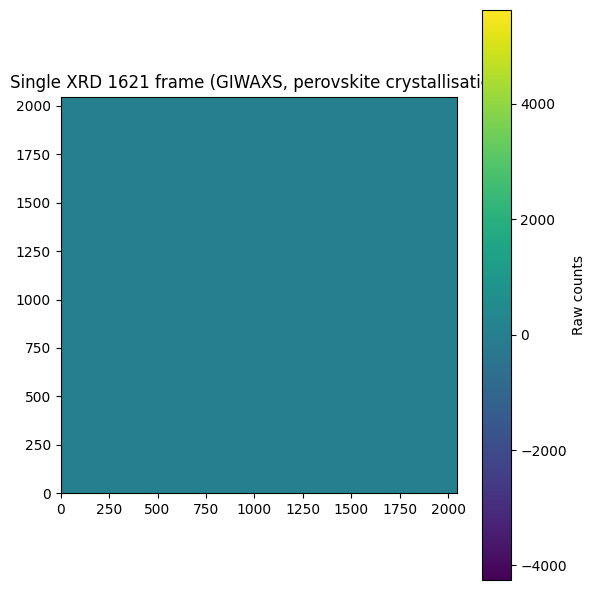

In [57]:
import requests, gzip, io, imageio.v3 as iio
import matplotlib.pyplot as plt

# --- download just one frame (≈10 MB) ---
url = "https://zenodo.org/record/6683617/files/raw_img_00000.tif.gz"  # replace index as needed
buf = io.BytesIO(requests.get(url, timeout=60).content)

# --- decompress and load ---
with gzip.open(buf) as gz:
    img = iio.imread(gz).astype(float)        # 2 048 × 2 048


plt.figure(figsize=(6,6))
plt.imshow(img, cmap="viridis", origin="lower")
plt.colorbar(label="Raw counts")
plt.title("Single XRD 1621 frame (GIWAXS, perovskite crystallisation)")
plt.tight_layout(); plt.show()


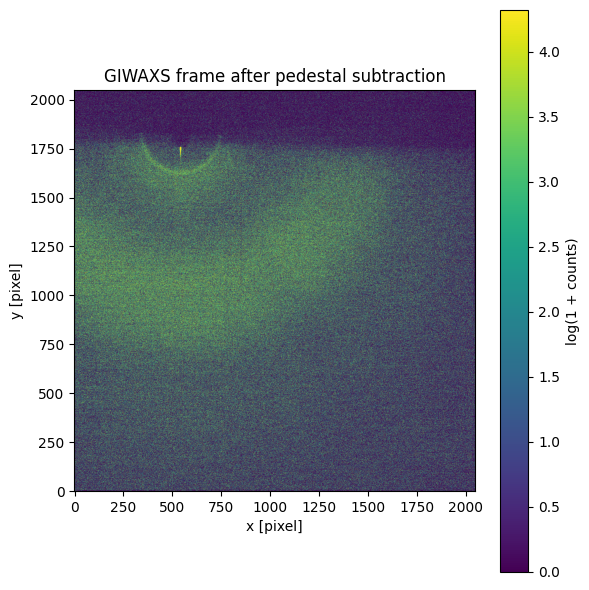

In [60]:
import gzip, io, requests, numpy as np, matplotlib.pyplot as plt, imageio.v3 as iio

# --- download & decompress one raw frame (10 MB) -------------------------
url  = "https://zenodo.org/record/6683617/files/raw_img_00180.tif.gz"
img  = iio.imread(gzip.open(io.BytesIO(requests.get(url, timeout=60).content)))

# --- 1) subtract detector pedestal --------------------------------------
pedestal = np.median(img)            # ~ constant for the whole series
img_corr = img.astype(float) - pedestal

# --- 2) clip the colour scale to useful percentiles ----------------------
vmin, vmax = np.percentile(img_corr, (1, 99.9))

# --- 3) plot on a log scale ---------------------------------------------
plt.figure(figsize=(6,6))
plt.imshow(np.log1p(img_corr.clip(min=0)),       # log(1+I) avoids log(0)
           origin="lower", cmap="viridis", vmin=np.log1p(max(vmin,0)),
           vmax=np.log1p(vmax))
plt.colorbar(label="log(1 + counts)")
plt.xlabel("x [pixel]"); plt.ylabel("y [pixel]")
plt.title("GIWAXS frame after pedestal subtraction")
plt.tight_layout(); plt.show()


In [68]:
import h5py
path = "nexus_dataset.h5"

with h5py.File(path, 'r') as f:
    # List all groups and datasets in the file
    print("Groups and datasets in the file:")
    for key in f.keys():
        print(f" - {key}")

    p08 = f["DESY-P08"]
    sample_names = list(p08.keys())
    print(f"{len(sample_names)} samples:", *sample_names[:10], "...")

    sample = "glass|ITO|MAPI"    # choose any name from the previous printout
    sgrp   = p08[sample]
    print("Keys in sample group:", list(sgrp.keys()))
    print(sgrp["experiment"].keys())
    print(sgrp["experiment"]["signal"])

Groups and datasets in the file:
 - DESY-P08
 - ESRF-ID10
20 samples: 3layerglass|ITO|2Dperovskite|BA(n=1)_0 3layerglass|ITO|2Dperovskite|BA(n=1)_1 3layerglass|ITO|2Dperovskite|BA(n=1)_2 3layerglass|ITO|2Dperovskite|BAMAI(n=3)_0 3layerglass|ITO|2Dperovskite|PEAMAI(n=3)_0 3layerglass|ITO|2Dperovskite|PEAMAI(n=3)_1 3layerglass|ITO|2Dperovskite|PEAMAI(n=3)_2 3layerglass|ITO|2Dperovskite|PEAMAI(n=3)_3 3layerglass|ITO|2Dperovskite|PEAMAI(n=3)_4 3layerglass|ITO|2Dperovskite|PEAMAI(n=3)_5 ...
Keys in sample group: ['experiment', 'fits', 'metadata']
<KeysViewHDF5 ['signal']>
<HDF5 dataset "signal": shape (1350, 1350), type "<f4">


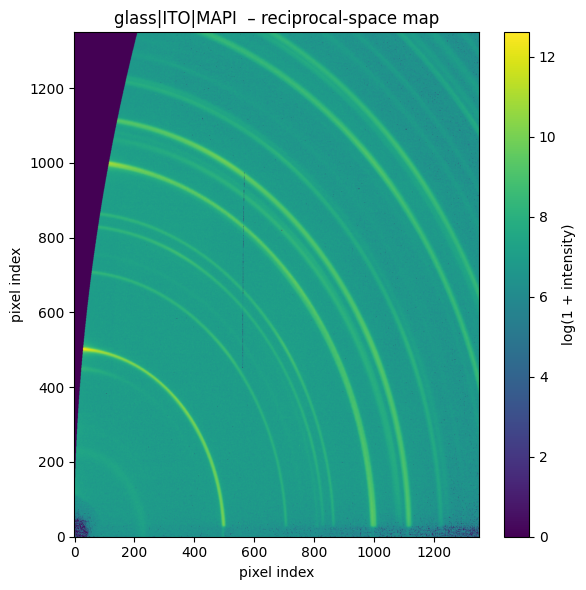

In [69]:
import h5py, numpy as np, matplotlib.pyplot as plt, pathlib

path = pathlib.Path("nexus_dataset.h5")     # adjust if needed
sample = "glass|ITO|MAPI"

with h5py.File(path, "r") as f:
    base = f[f"DESY-P08/{sample}/experiment"]
    Iq   = base["signal"][()]              # (1350,1350) float32
    
    # try to fetch the q-axes if they exist -----------------------------
    qx = base.get("qx") or base.get("q_par") or base.get("q")   # may return None
    qz = base.get("qz") or base.get("q_perp")
    
    if qx is not None and qz is not None:
        qx = qx[()] ; qz = qz[()]
        extent = [qx.min(), qx.max(), qz.min(), qz.max()]
        xlabel, ylabel = "q$_x$ (Å$^{-1}$)", "q$_z$ (Å$^{-1}$)"
    else:
        extent = None
        xlabel = ylabel = "pixel index"

# ----------------------------------------------------------------------
# log-scale display
plt.figure(figsize=(6,6))
plt.imshow(np.log1p(np.clip(Iq, 0, None)),
           origin="lower", cmap="viridis", extent=extent, aspect='auto')
plt.colorbar(label="log(1 + intensity)")
plt.title(f"{sample}  – reciprocal-space map")
plt.xlabel(xlabel); plt.ylabel(ylabel)
plt.tight_layout();  plt.show()
